In [4]:
import pandas as pd

trainLabels = pd.read_csv(r'C:\Users\User\Desktop\PROJECTS\ug\input3\trainLabels.csv')
trainLabels.head()


,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1


In [5]:
from PIL import Image
from keras.preprocessing import image
import os
import numpy as np

# resize the image to (256, 256)
img_rows, img_cols = 256, 256

listing = os.listdir(r'C:\Users\User\Desktop\PROJECTS\ug\input3') 
listing.remove('trainLabels.csv')

immatrix = []
imlabel = []

for file in listing:
    base = os.path.basename(r'C:\Users\User\Desktop\PROJECTS\ug\input3' + file)
    fileName = os.path.splitext(base)[0]
    fileName1=fileName.replace("input3","")
    print(fileName1)
    print(trainLabels.image==fileName1)
    print(trainLabels.loc[trainLabels.image==fileName1, 'level'])
    #print(trainLabels.loc['10_left', 'level'])
    imlabel.append(trainLabels.loc[trainLabels.image==fileName1, 'level'].values[0])
    im = Image.open(r'C:/Users/User/Desktop/PROJECTS/ug/input3/' + file)
    img = np.array(im.resize((img_rows,img_cols)))
    
    # convert to green channel only
    img[:,:,[0,2]] = 0
    immatrix.append(img)
    print("IMLABEL")
    print(imlabel)
    print("IMMATRIX")
    print(immatrix)

10_left
0         True
1        False
2        False
3        False
4        False
         ...  
35121    False
35122    False
35123    False
35124    False
35125    False
Name: image, Length: 35126, dtype: bool
0    0
Name: level, dtype: int64
IMLABEL
[0]
IMMATRIX
[array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
    

level: 0


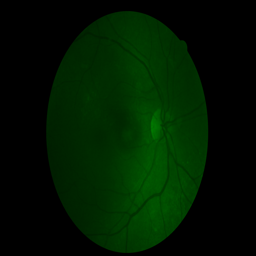

In [6]:
im = Image.fromarray(immatrix[1],'RGB')
print("level:",imlabel[1])
im

In [8]:
import random

# define transformation methods
def horizontal_flip(image_array):
    return image_array[:, ::-1]

def vertical_flip(image_array):
    return image_array[::-1,:]

def random_transform(image_array):
    if random.random() < 0.5:
        return vertical_flip(image_array)
    else:
        return horizontal_flip(image_array)

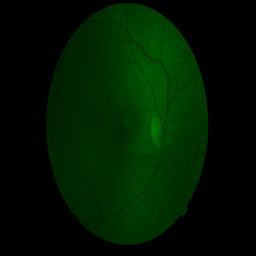

In [9]:
im = Image.fromarray(vertical_flip(immatrix[1]),'RGB')
im

In [10]:
length = len(immatrix)
for i in range(length):
    if random.random() < 0.1:
        immatrix.append(random_transform(immatrix[i]))
        imlabel.append(imlabel[i])
        
print("Size of image array before augmentation: ", length)
print("Size fo image array after augmentation: ", len(immatrix))

Size of image array before augmentation:  147
Size fo image array after augmentation:  156


In [11]:
from sklearn.utils import shuffle

data,label = shuffle(immatrix, imlabel, random_state=42)
train_data = [data,label]
print(train_data)

[[array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8), array([[[0, 0, 0],
        [0, 1, 0],
        [0, 1, 0],
        ...,
        [0, 1, 0],
        [0, 2, 0],
        [0, 2, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...

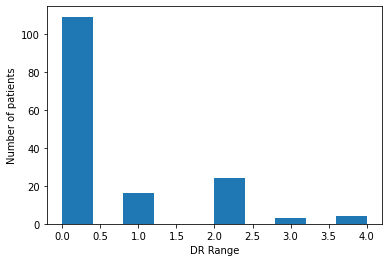

In [12]:
import matplotlib.pyplot as plt

plt.hist(label)
plt.xlabel('DR Range')
plt.ylabel('Number of patients')
plt.show()

In [13]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(train_data[0], train_data[1], test_size = 0.1, random_state = 42)

print(np.array(x_train).shape)
print(np.array(y_train).shape)

(140, 256, 256, 3)
(140,)


In [14]:
from keras.utils import np_utils

y_train = np_utils.to_categorical(np.array(y_train), 5)
y_test = np_utils.to_categorical(np.array(y_test), 5)

x_train = np.array(x_train).astype("float32")/255.
x_test = np.array(x_test).astype("float32")/255.

print(np.array(y_train).shape)

(140, 5)


In [18]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization

model = Sequential()

model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=x_train[0].shape))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(activation='softmax', units=5))

model.compile(loss='categorical_crossentropy', optimizer = keras.optimizers.SGD(lr=0.0001, momentum=0.9), metrics=["accuracy"])

In [19]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 256, 256, 32)      896       
                                                                 
 conv2d_13 (Conv2D)          (None, 254, 254, 32)      9248      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 127, 127, 32)     0         
 2D)                                                             
                                                                 
 dropout_8 (Dropout)         (None, 127, 127, 32)      0         
                                                                 
 conv2d_14 (Conv2D)          (None, 127, 127, 64)      18496     
                                                                 
 conv2d_15 (Conv2D)          (None, 125, 125, 64)      36928     
                                                      

In [20]:
model.fit(x_train, y_train, batch_size = 64, epochs=10, shuffle=True, verbose=2)

Epoch 1/10
3/3 - 45s - loss: 1.6016 - accuracy: 0.3071 - 45s/epoch - 15s/step
Epoch 2/10
3/3 - 23s - loss: 1.6007 - accuracy: 0.3071 - 23s/epoch - 8s/step
Epoch 3/10
3/3 - 24s - loss: 1.5954 - accuracy: 0.4000 - 24s/epoch - 8s/step
Epoch 4/10
3/3 - 24s - loss: 1.5876 - accuracy: 0.4929 - 24s/epoch - 8s/step
Epoch 5/10
3/3 - 24s - loss: 1.5762 - accuracy: 0.5643 - 24s/epoch - 8s/step
Epoch 6/10
3/3 - 24s - loss: 1.5673 - accuracy: 0.6286 - 24s/epoch - 8s/step
Epoch 7/10
3/3 - 23s - loss: 1.5584 - accuracy: 0.6500 - 23s/epoch - 8s/step
Epoch 8/10
3/3 - 23s - loss: 1.5453 - accuracy: 0.7000 - 23s/epoch - 8s/step
Epoch 9/10
3/3 - 23s - loss: 1.5353 - accuracy: 0.7000 - 23s/epoch - 8s/step
Epoch 10/10
3/3 - 23s - loss: 1.5192 - accuracy: 0.7071 - 23s/epoch - 8s/step


In [24]:
predictions = model.predict(x_test)
print(predictions)
print(y_test)

1/1 [==============================] - 1s 1s/step
[[0.22639108 0.19555365 0.19503233 0.1890874  0.1939355 ]
 [0.218632   0.19721806 0.19675721 0.19207224 0.19532047]
 [0.22037487 0.19537711 0.1970883  0.19221833 0.19494148]
 [0.22058074 0.19551297 0.19654813 0.19229926 0.19505894]
 [0.21910563 0.19611725 0.19798137 0.1930143  0.19378142]
 [0.21953659 0.19707422 0.19777167 0.19145115 0.1941664 ]
 [0.21834785 0.19622144 0.19659577 0.19275138 0.19608365]
 [0.22366256 0.1956369  0.19541736 0.19110365 0.19417953]
 [0.22032689 0.19634992 0.19770253 0.19126786 0.1943528 ]
 [0.21423708 0.1972643  0.19761918 0.19437326 0.19650619]
 [0.21891224 0.1963249  0.19835709 0.19181693 0.1945888 ]
 [0.22042584 0.19599839 0.19684874 0.19192433 0.19480267]
 [0.21954603 0.19681059 0.19730788 0.1916182  0.19471732]
 [0.21924989 0.19686837 0.19715486 0.19194955 0.19477724]
 [0.22317587 0.19545357 0.19715069 0.1904893  0.19373049]
 [0.21916367 0.1968124  0.19751519 0.19184665 0.19466203]]
[[1. 0. 0. 0. 0.]
 [1

In [25]:
score = model.evaluate(x_test, y_test, verbose=0)
print(score[1])

0.625
